In [13]:
###  Loading Audio File

import librosa
audio_path = 'C:/Users/Lenovo/Desktop/NCI/Semester 2/Data Mining and Machine Learning 2/000002.wav'
x , sr = librosa.load(audio_path)
print(type(x), type(sr))

print(x.shape, sr)


<class 'numpy.ndarray'> <class 'int'>
(660984,) 22050


In [3]:
## Play audio

import IPython.display as ipd
ipd.Audio(audio_path)

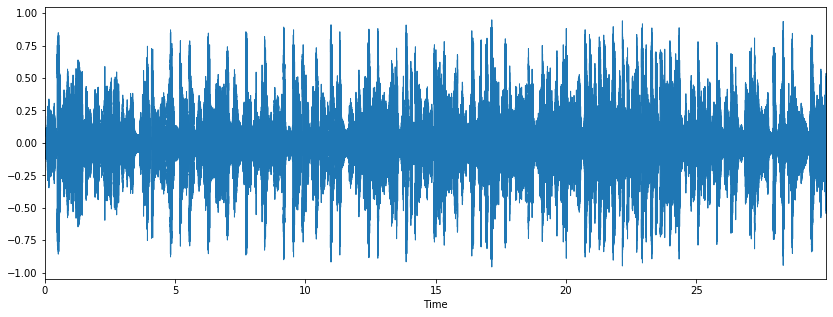

In [14]:
## plot of audio

%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

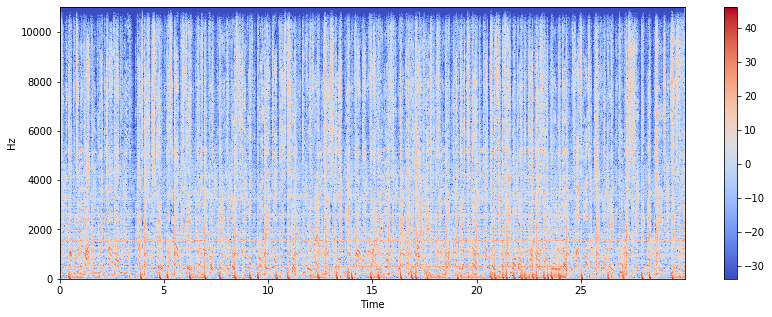

In [15]:
### Spectrogram

X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

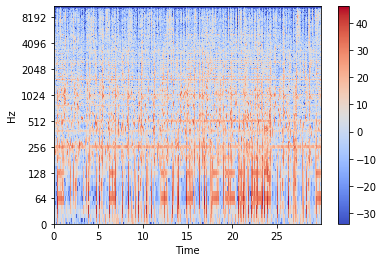

In [16]:
## changing frequency time

librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

In [17]:
## writing audio

librosa.output.write_wav('C:/Users/Lenovo/Desktop/NCI/Semester 2/Data Mining and Machine Learning 2/example.wav', x, sr)

In [19]:
## creating an audio signal

import numpy as np
sr = 22050 # sample rate
T = 5.0    # seconds
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
x = 0.5*np.sin(2*np.pi*220*t)# pure sine wave at 220 Hz
##Playing the audio
ipd.Audio(x, rate=sr) # load a NumPy array
##Saving the audio
#librosa.output.write_wav('tone_220.wav', x, sr)

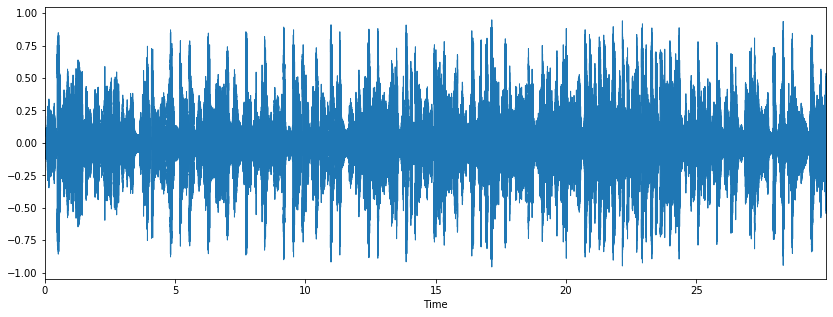

In [20]:
### Feature Extraction

##Zero crossing rate

# Load the signal
x, sr = librosa.load('C:/Users/Lenovo/Desktop/NCI/Semester 2/Data Mining and Machine Learning 2/000002.wav')
#Plot the signal:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

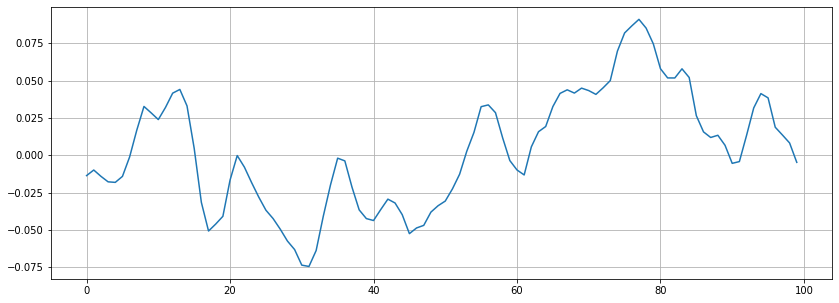

In [21]:
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.grid()

In [22]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

8


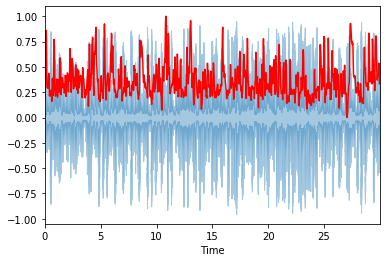

In [24]:
### Spectral centroid
import sklearn
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape
(775,)
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

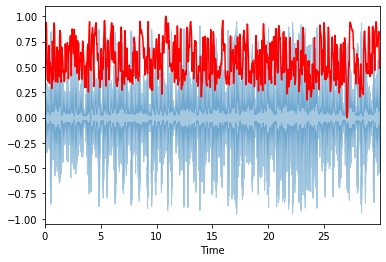

In [25]:
## spectral roll off

spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

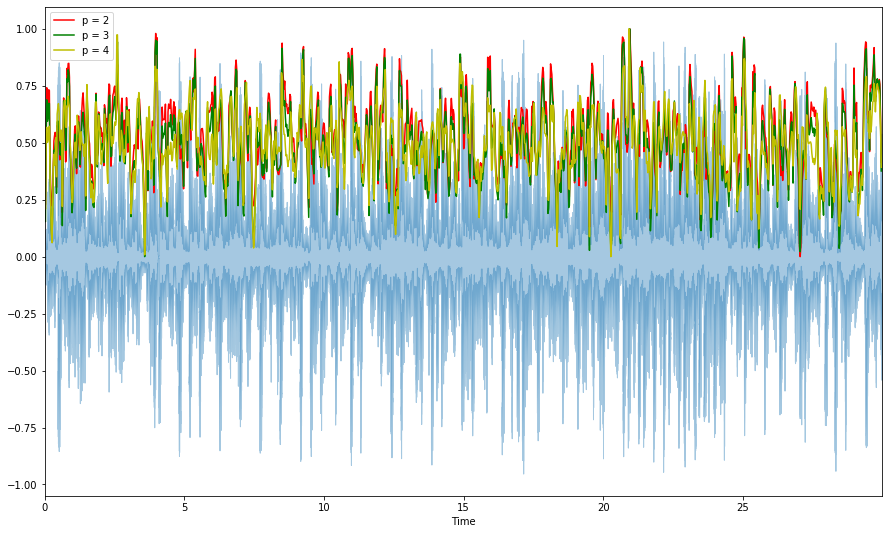

In [27]:
### bandwidth

spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=4)[0]
plt.figure(figsize=(15, 9))
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_bandwidth_2), color='r')
plt.plot(t, normalize(spectral_bandwidth_3), color='g')
plt.plot(t, normalize(spectral_bandwidth_4), color='y')
plt.legend(('p = 2', 'p = 3', 'p = 4'))

(20, 1291)


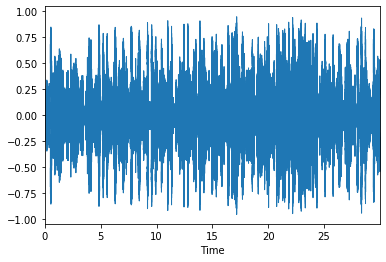

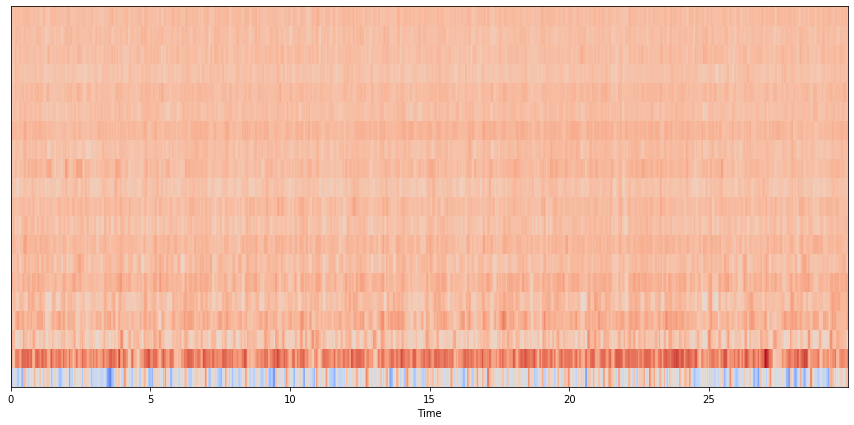

In [29]:
## Mel-Frequency Cepstral Coefficients

x, fs = librosa.load(audio_path)
librosa.display.waveplot(x, sr=sr)

mfccs = librosa.feature.mfcc(x, sr=fs)
print(mfccs.shape)
(20, 97)
#Displaying  the MFCCs:
plt.figure(figsize=(15, 7))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

[-5.9096781e-09  1.1819356e-08  2.9548390e-09  5.9096781e-09
  5.9096781e-09  2.9548390e-09 -4.4322586e-09  5.9096781e-09
 -5.9096781e-09  0.0000000e+00  0.0000000e+00  5.9096781e-09
  0.0000000e+00 -1.1819356e-08 -1.1819356e-08  0.0000000e+00
 -5.9096781e-09 -5.9096781e-09 -5.9096781e-09  8.8645171e-09]
[1.        1.        0.9999999 0.9999998 0.9999999 1.        1.0000001
 0.9999998 1.0000002 1.0000001 1.        1.        1.        1.
 1.        1.        0.9999998 1.        0.9999999 1.       ]


C:\Users\Lenovo\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\Lenovo\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


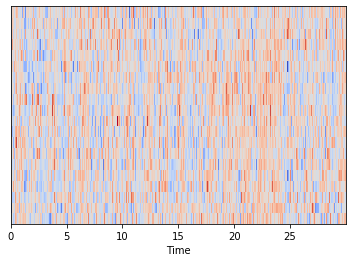

In [30]:
### feature scaling

import sklearn
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

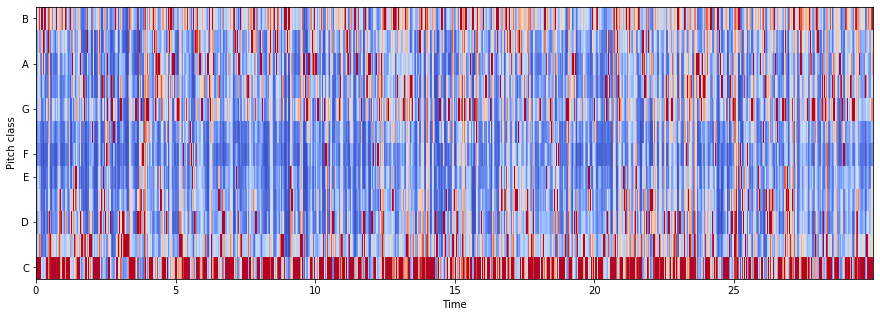

In [31]:
## chrom frequency

# Loadign the file
x, sr = librosa.load(audio_path)
hop_length = 512
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

In [32]:
from subprocess import call
r=call('ffmpeg -i "C:/Users/Lenovo/Desktop/NCI/Semester 2/Data Mining and Machine Learning 2/000/000002.mp3" -acodec pcm_u8 -ar 22050 "C:/Users/Lenovo/Desktop/NCI/Semester 2/Data Mining and Machine Learning 2/test.wav"',shell=True)
import librosa
y, sr = librosa.load("C:/Users/Lenovo/Desktop/NCI/Semester 2/Data Mining and Machine Learning 2/test.wav")

In [34]:
print(type(y), type(sr))

print(y.shape, sr)

<class 'numpy.ndarray'> <class 'int'>
(660984,) 22050


In [35]:
import IPython.display as ipd
ipd.Audio('C:/Users/Lenovo/Desktop/NCI/Semester 2/Data Mining and Machine Learning 2/test.wav')